In [6]:
#https://aqibsaeed.github.io/2016-09-03-urban-sound-classification-part-1/

In [7]:
import glob
import os
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from matplotlib.pyplot import specgram
from datetime import datetime
%matplotlib inline

In [8]:
print (librosa.__version__)

0.5.1


In [9]:
#set FIXED variables
HOMEPATH = "/home/ubuntu/fastai/"
DATAPATH = HOMEPATH + "data/urbanSound8k/"

In [10]:
def load_sound_files(file_paths):
    raw_sounds = []
    for fp in file_paths:
        X,sr = librosa.load(DATAPATH+fp)
        print ("X:", type(X), X.shape, "sr:", type(sr))
        raw_sounds.append(X)
    return raw_sounds

In [11]:
def plot_wave(sound_name,raw_sound):
    print ("plot_wave")
    fig = plt.figure(figsize=(8,6), dpi = 900)
    librosa.display.waveplot(np.array(raw_sound),sr=22050)
    plt.title(sound_name.title())
    plt.show()

In [12]:
def plot_waves(sound_names,raw_sounds):
    print ("plot_waves")
    i = 1
    fig = plt.figure(figsize=(8,6), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        print ("plotting i:", i)
        plt.subplot(len(sound_names),1,i)
        librosa.display.waveplot(np.array(f),sr=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle("Figure 1: Waveplot",x=0.5, y=0.915,fontsize=18)
    plt.show()

In [13]:
def plot_specgram_(sound_name,raw_sound):
    print ("plot_specgram_")
    fig = plt.figure(figsize=(8,6), dpi = 900)
    specgram(np.array(raw_sound), Fs=22050)
    plt.title(sound_name.title())
    plt.suptitle("Figure 2: Spectrogram",x=0.5, y=0.915,fontsize=18)
    plt.show()


In [14]:
def plot_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(8,6), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(5,1,i)
        specgram(np.array(f), Fs=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle("Figure 2: Spectrogram",x=0.5, y=0.915,fontsize=18)
    plt.show()


In [15]:
def plot_log_power_specgram_(sound_name,raw_sound):
    fig = plt.figure(figsize=(8,6), dpi = 900)
    D = librosa.logamplitude(np.abs(librosa.stft(raw_sound))**2, ref_power=np.max)
    librosa.display.specshow(D,x_axis='time' ,y_axis='log')
    plt.title(sound_name.title())
    plt.suptitle("Figure 3: Log power spectrogram",x=0.5, y=0.915,fontsize=18)
    plt.show()

In [16]:
def plot_log_power_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,60), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        D = librosa.logamplitude(np.abs(librosa.stft(f))**2, ref_power=np.max)
        librosa.display.specshow(D,x_axis='time' ,y_axis='log')
        plt.title(n.title())
        i += 1
    plt.suptitle("Figure 3: Log power spectrogram",x=0.5, y=0.915,fontsize=18)
    plt.show()

In [17]:
sound_file_paths = ["327666__juan-merie-venter__dog-bark.wav", 
                    "337101__ivolipa__group-of-dogs-barking.wav", 
                    "35667__sandyrb__bmse-snare-001.wav", 
                    "402958__inspectorj__car-alarm-horn-walking-past-a.wav", 
                    "406085__inspectorj__dog-barking-single-a.wav"]

sound_names = ["dog-bark",
               "group-of-dogs-barking",
               "snare", 
               "car-alarm-horn",
               "dog-barking-single"]

In [18]:
raw_sounds = load_sound_files(sound_file_paths)


X: <class 'numpy.ndarray'> (142718,) sr: <class 'int'>
X: <class 'numpy.ndarray'> (479779,) sr: <class 'int'>
X: <class 'numpy.ndarray'> (25778,) sr: <class 'int'>
X: <class 'numpy.ndarray'> (557000,) sr: <class 'int'>
X: <class 'numpy.ndarray'> (1470021,) sr: <class 'int'>


In [19]:
print (type(raw_sounds), type(raw_sounds[0]), raw_sounds[0].shape)

<class 'list'> <class 'numpy.ndarray'> (142718,)


In [20]:
print (len(sound_names))
print (len(sound_file_paths))
print (len(raw_sounds))

5
5
5


start
plot_wave


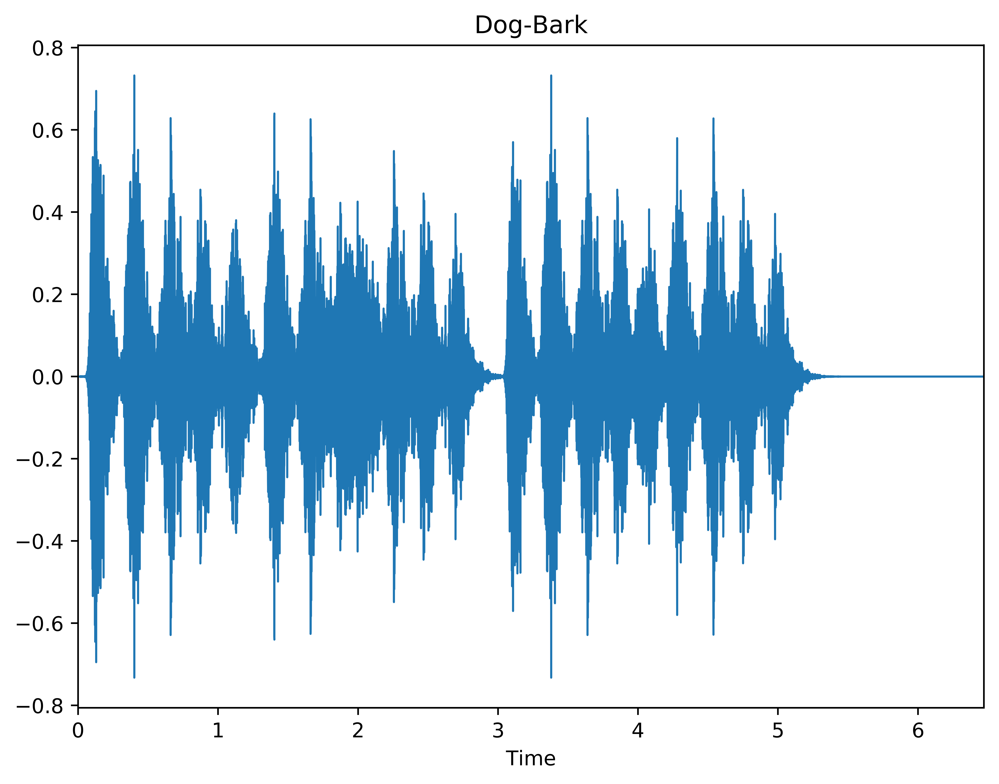

done


In [21]:
print("start")
plot_wave(sound_names[0],raw_sounds[0])
print("done")

plot_wave


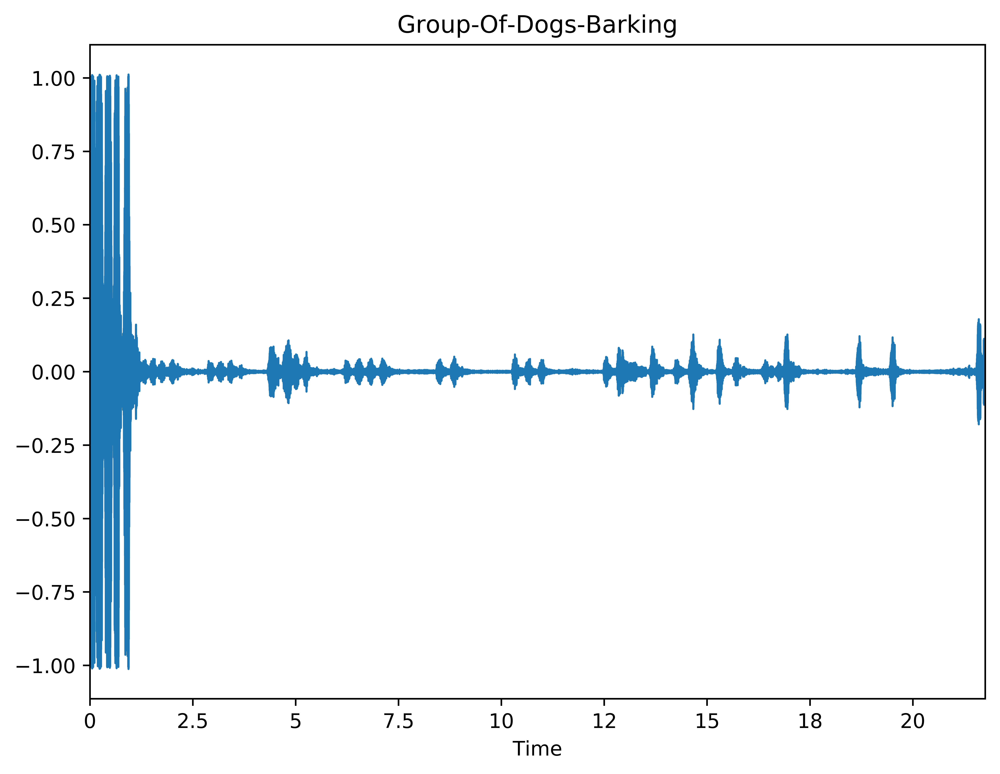

In [22]:
plot_wave(sound_names[1],raw_sounds[1])

plot_wave


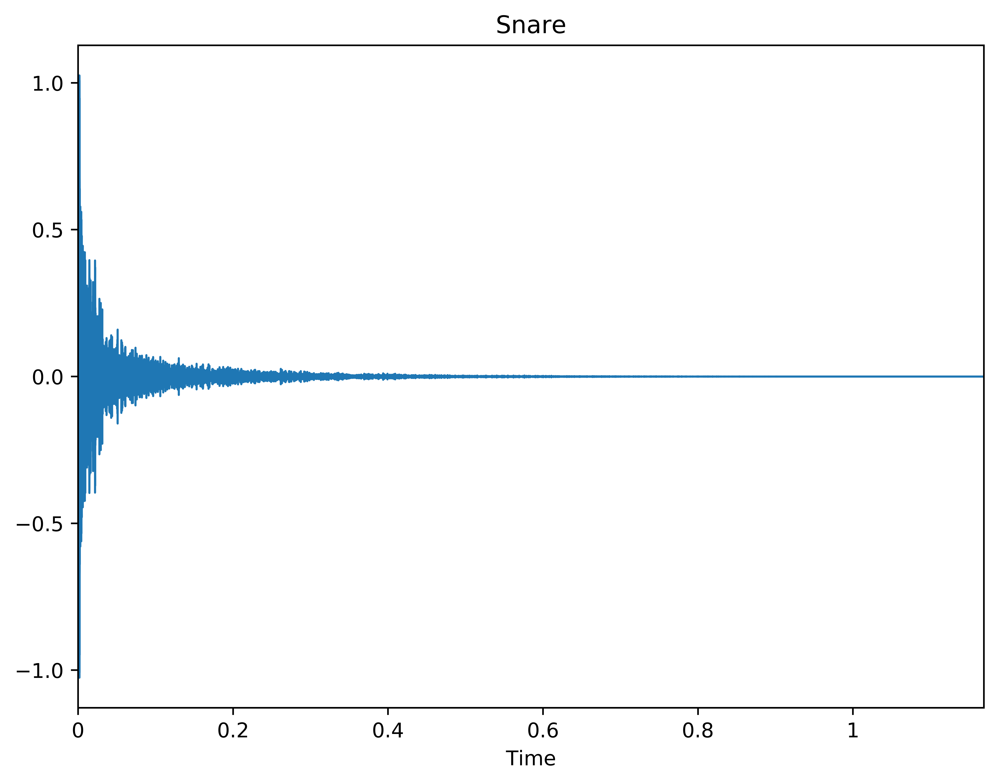

In [23]:
plot_wave(sound_names[2],raw_sounds[2])

plot_wave


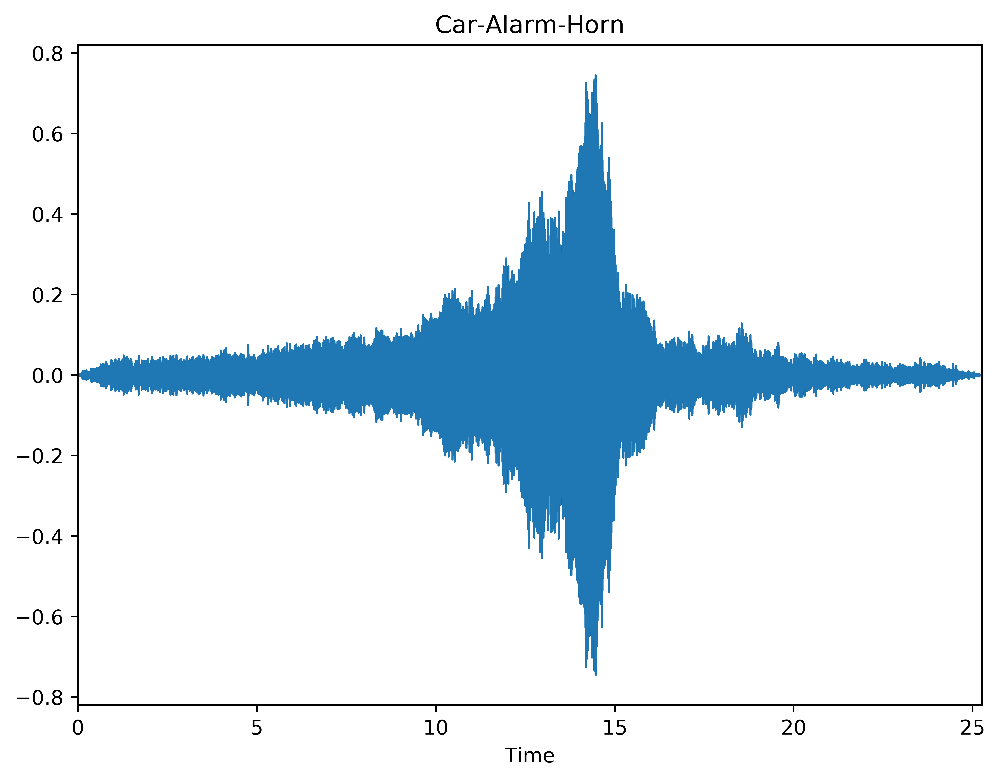

In [24]:
plot_wave(sound_names[3],raw_sounds[3])

plot_wave


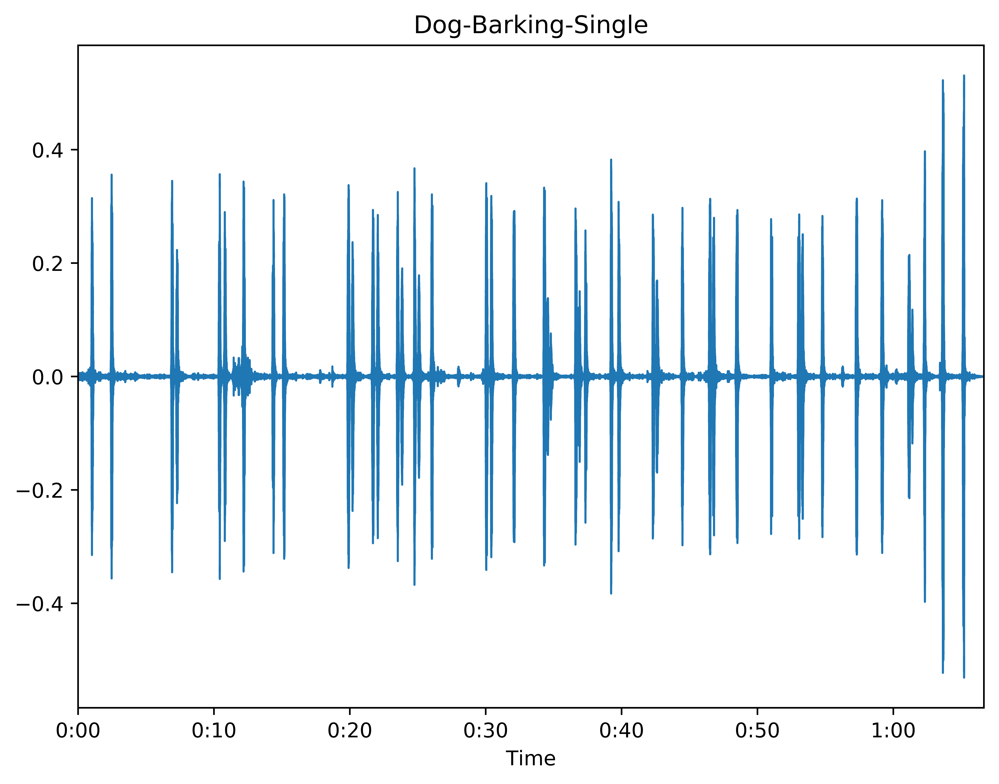

In [25]:
plot_wave(sound_names[4],raw_sounds[4])

In [26]:
#plot_waves(sound_names,raw_sounds)

plot_specgram_


/usr/local/lib/python3.5/dist-packages/matplotlib/axes/_axes.py:7221: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


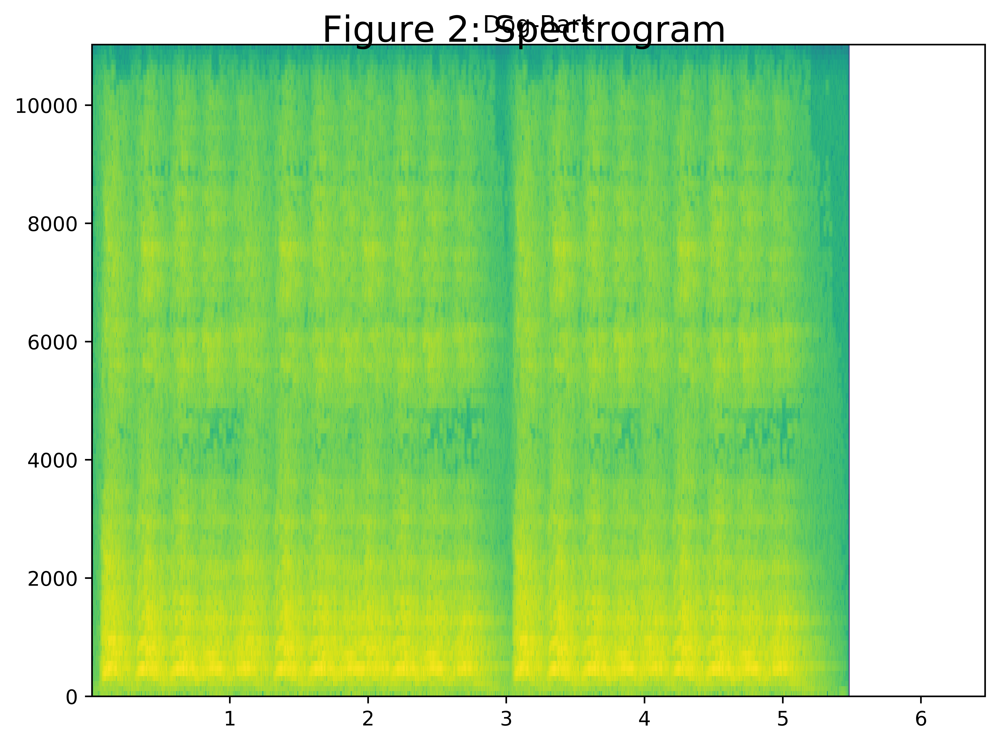

In [27]:
plot_specgram_(sound_names[0],raw_sounds[0])

plot_specgram_


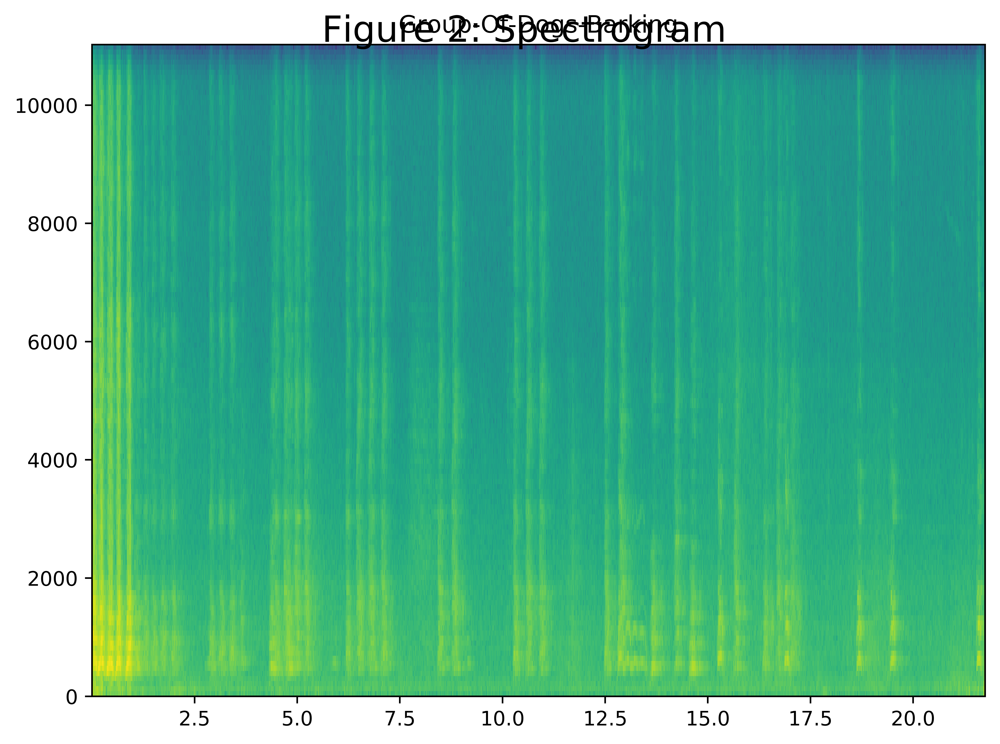

In [28]:
plot_specgram_(sound_names[1],raw_sounds[1])

plot_specgram_


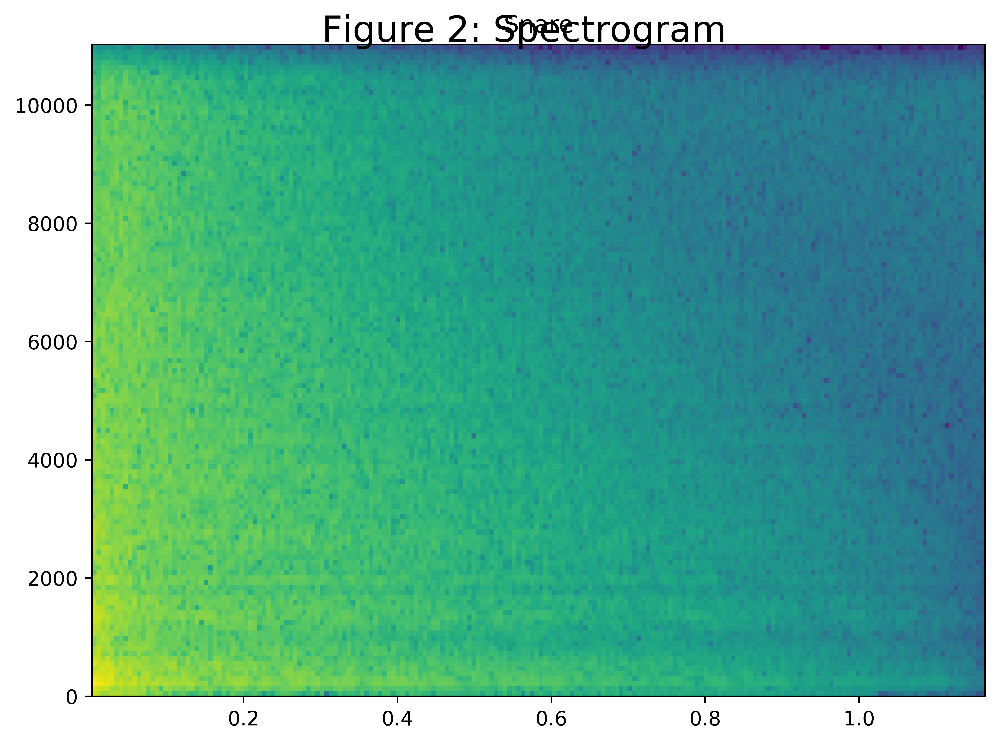

In [29]:
plot_specgram_(sound_names[2],raw_sounds[2])

plot_specgram_


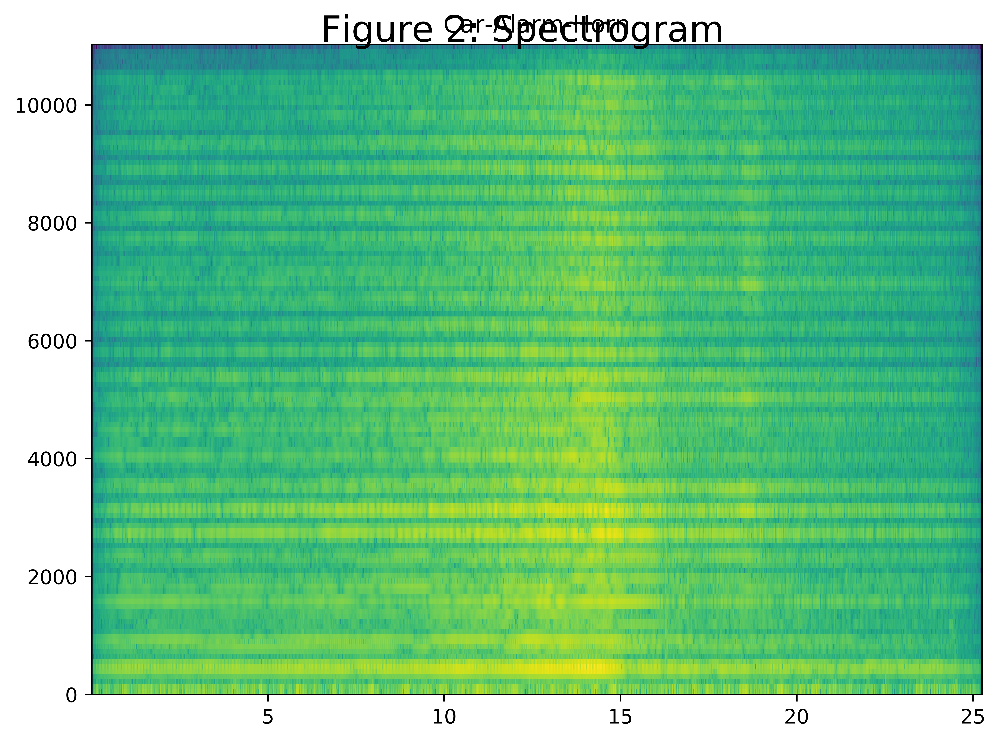

In [30]:
plot_specgram_(sound_names[3],raw_sounds[3])

plot_specgram_


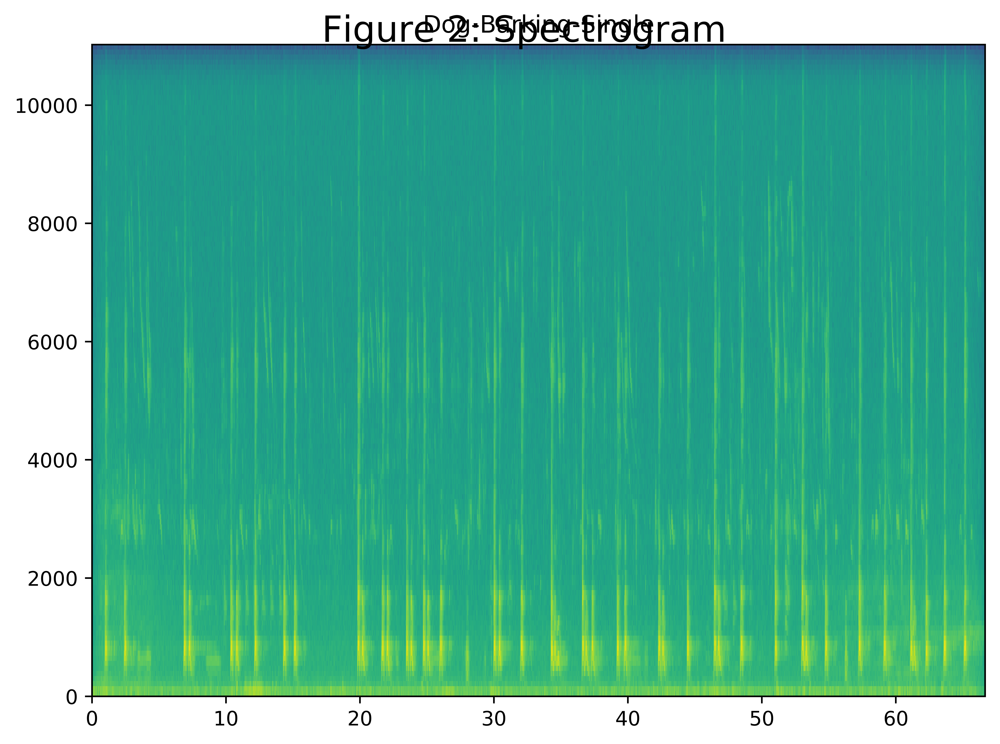

In [31]:
plot_specgram_(sound_names[4],raw_sounds[4])

In [ ]:
#plot_specgram(sound_names,raw_sounds)

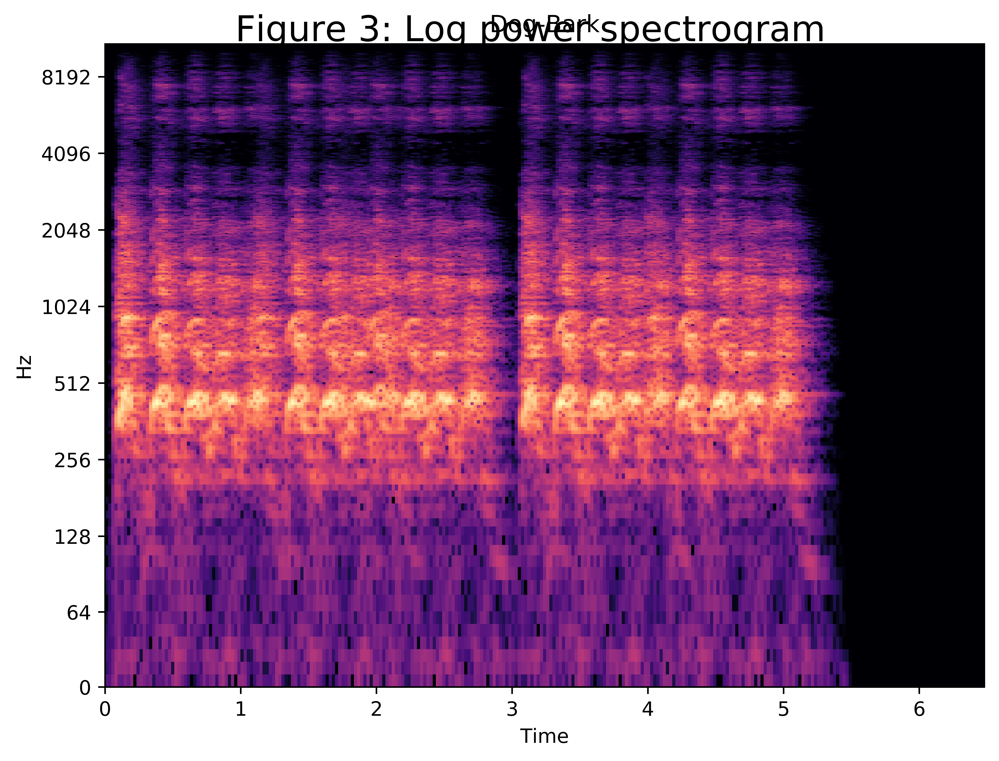

In [32]:
plot_log_power_specgram_(sound_names[0],raw_sounds[0])

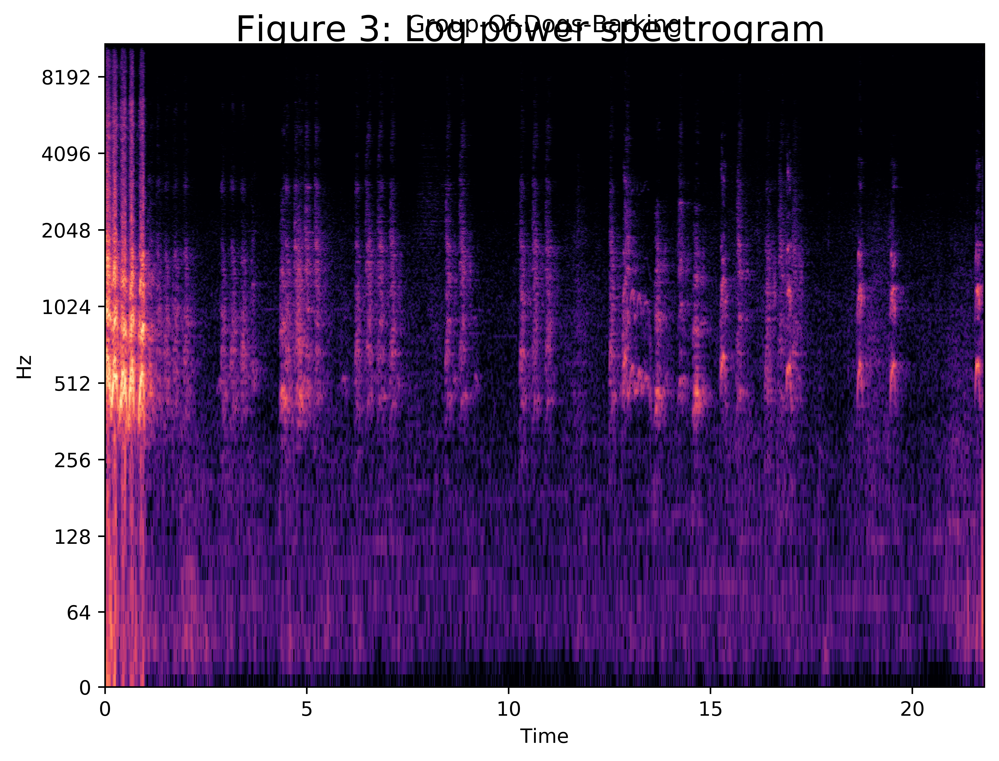

In [33]:
plot_log_power_specgram_(sound_names[1],raw_sounds[1])

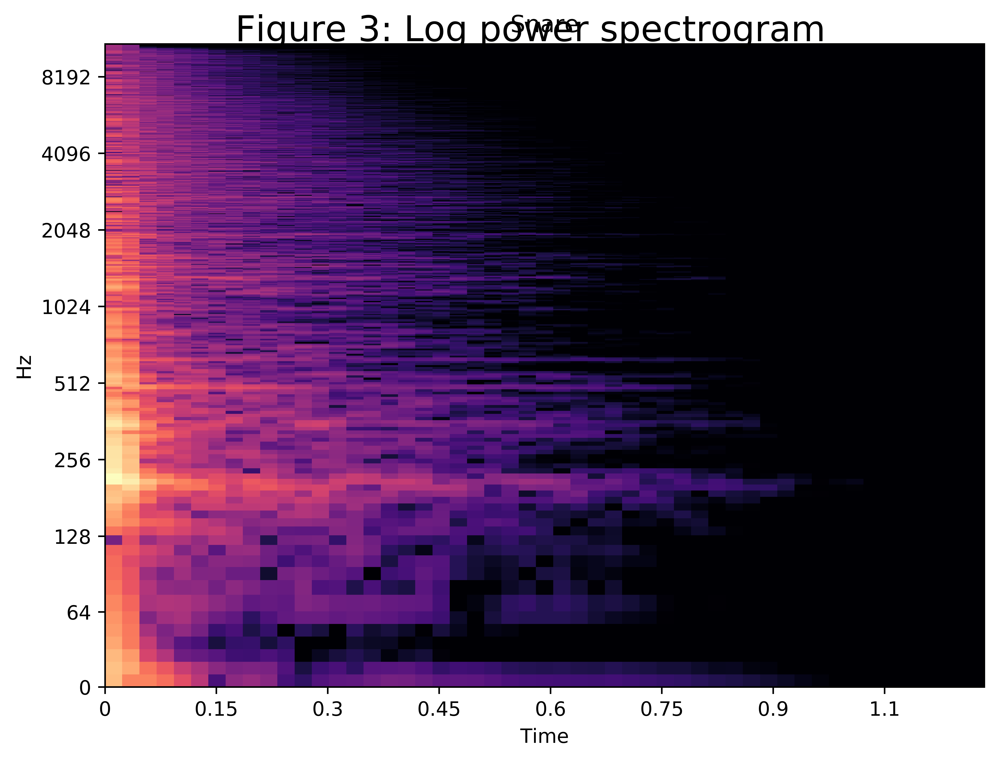

In [34]:
plot_log_power_specgram_(sound_names[2],raw_sounds[2])

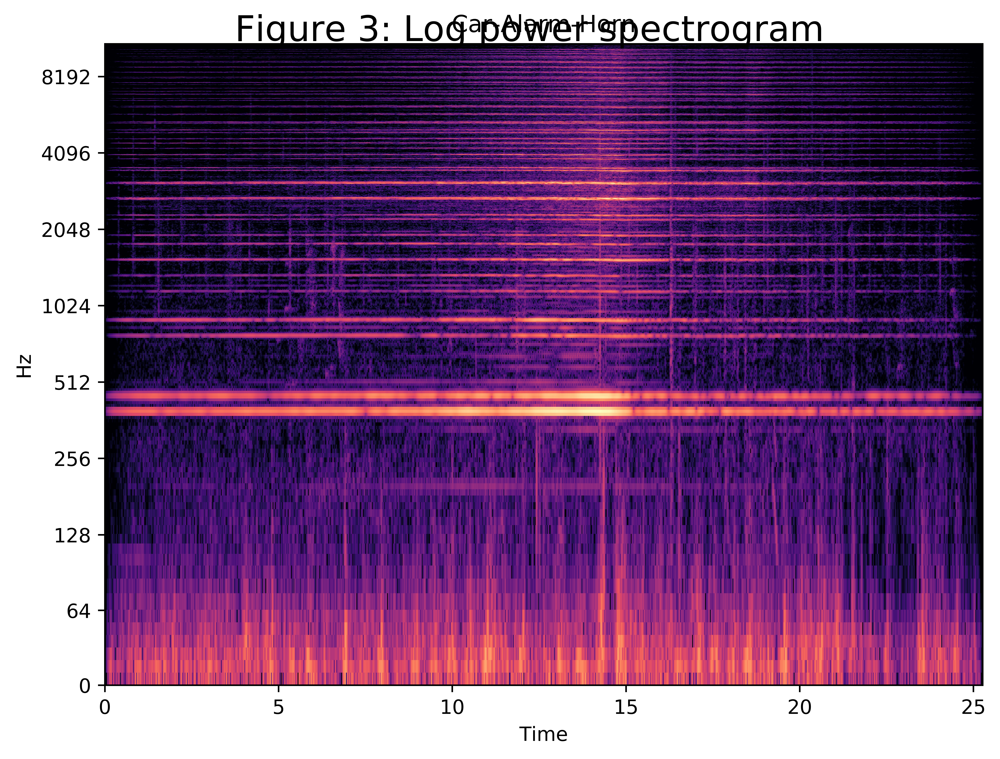

In [ ]:
plot_log_power_specgram_(sound_names[3],raw_sounds[3])

In [ ]:
plot_log_power_specgram_(sound_names[4],raw_sounds[4])

In [ ]:
#plot_log_power_specgram(sound_names,raw_sounds)

In [ ]:
def extract_feature(file_name):
    X, sample_rate = librosa.load(file_name)
    stft = np.abs(librosa.stft(X))
    mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=40).T,axis=0)
    chroma = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T,axis=0)
    mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
    contrast = np.mean(librosa.feature.spectral_contrast(S=stft, sr=sample_rate).T,axis=0)
    tonnetz = np.mean(librosa.feature.tonnetz(y=librosa.effects.harmonic(X),
    sr=sample_rate).T,axis=0)
    return mfccs,chroma,mel,contrast,tonnetz
